# IS 445 - Final Project - Part 3.1

## Are people getting more inclined to purchase firearms?
## Are red states purchasing more guns than blue states?

### Group members:
- Xiuyuan Wang (xiuyuan7)
- Jing Wang (jingw13)
- Yichen Huang (yichenh8)

# Dataset Intro

## What is our dataset about?
According to FBI's National Instant Criminal Background Check System: "Mandated by the Brady Handgun Violence Prevention Act of 1993 and launched by the FBI on November 30, 1998, NICS is used by Federal Firearms Licensees (FFLs) to **instantly determine whether a prospective buyer is eligible to buy firearms or explosives**. Before ringing up the sale, cashiers call in a check to the FBI or to other designated agencies to ensure that each customer does not have a criminal record or isn’t otherwise ineligible to make a purchase. More than 100 million such checks have been made in the last decade, leading to more than 700,000 denials."     

So here we can say that background check is not equal to a deal of fireare sale, because people can  1.) fail the check or 2.) pass the check but decide not to proceed with the purchase.


## Why are we interested in the dataset? 
Even though the background check statistics do not equal the number of firearms sold, the two are strongly correlated. So from our perspective, background check data can provide us with insights into purchasing trend of firearms.      

Over the years, public disagreement over laws of firearm ownership is only getting deeper. In the meantime, the number of total violent crime reported in the United States is rising. We are interested in the relationship between people's ownership of firearms and the crime rate. 

## Our topic of interest for Part 3.1

We would like to look at how the total checks change along with time and inspect how political attitudes may be reflected in the trend of gun checks. In order to do this, we first need to add a column to our dataset, *political* with nominal values: the swing states, blue states and red states. Then we will draw a line plot with 3 lines, each for a political standingl. And the x-axis is the year, the y-axis is the number of total checks. 


# General Data Preperation

In [2]:
# import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import altair as alt

In [3]:
# our data is more than 5000 rows. use this line to enable visualization with large data set
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [4]:
URL = 'https://raw.githubusercontent.com/BuzzFeedNews/nics-firearm-background-checks/master/data/nics-firearm-background-checks.csv'
df = pd.read_csv(URL)
df.head()

,month,state,permit,permit_recheck,handgun,long_gun,other,multiple,admin,prepawn_handgun,...,returned_other,rentals_handgun,rentals_long_gun,private_sale_handgun,private_sale_long_gun,private_sale_other,return_to_seller_handgun,return_to_seller_long_gun,return_to_seller_other,totals
0,2022-11,Alabama,15442.0,210.0,22068.0,19922.0,1190.0,1545,0.0,12.0,...,0.0,0.0,0.0,26.0,16.0,6.0,0.0,0.0,0.0,63954
1,2022-11,Alaska,292.0,5.0,3182.0,2890.0,332.0,265,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,19.0,0.0,0.0,0.0,7149
2,2022-11,Arizona,8007.0,1816.0,18816.0,9664.0,1513.0,1271,0.0,8.0,...,0.0,0.0,0.0,9.0,7.0,0.0,0.0,1.0,0.0,42895
3,2022-11,Arkansas,2325.0,308.0,7994.0,10304.0,439.0,598,6.0,7.0,...,0.0,0.0,0.0,11.0,9.0,3.0,0.0,2.0,0.0,24160
4,2022-11,California,24117.0,11341.0,37386.0,25634.0,4888.0,0,0.0,0.0,...,83.0,0.0,0.0,6830.0,2815.0,535.0,20.0,5.0,1.0,116394


In [5]:
# change the misleading column name: month, which is acutually date
df.rename(columns={'month': 'date'}, inplace=True)

# create 2 new columns each representing the year & month of the check
df[["year", "month"]] = df["date"].str.split("-", expand = True)
df[["year", "month"]] = df[["year", "month"]].astype(int)

# change the date column to datetime
df['date'] = pd.to_datetime(df['date'], format='%Y-%m')

In [6]:
df.isnull().values.any()

True

In [7]:
cols_to_convert = ['prepawn_handgun', 'prepawn_long_gun',
       'prepawn_other', 'redemption_handgun', 'redemption_long_gun',
       'redemption_other', 'returned_handgun', 'returned_long_gun',
       'returned_other', 'rentals_handgun', 'rentals_long_gun',
       'private_sale_handgun', 'private_sale_long_gun', 'private_sale_other',
       'return_to_seller_handgun', 'return_to_seller_long_gun',
       'return_to_seller_other']
for col in cols_to_convert:
    print(col, df[col].isnull().values.any())
    df[col].fillna(0, inplace = True)
    df[col] = df[col].astype(int)
  

prepawn_handgun True
prepawn_long_gun True
prepawn_other True
redemption_handgun True
redemption_long_gun True
redemption_other True
returned_handgun True
returned_long_gun True
returned_other True
rentals_handgun True
rentals_long_gun True
private_sale_handgun True
private_sale_long_gun True
private_sale_other True
return_to_seller_handgun True
return_to_seller_long_gun True
return_to_seller_other True


# Data Prep for Visualization

In [8]:
# divide the states into 3 groups
red_states = ['Idaho', 'Utah', 'Montana', 'Louisiana', 'Indiana', 'Kentucky', 'Tennessee', 'Mississippi', 'Wyoming', 'North Dakota', 'South Dakota', 'Nebraska', 'Kansas', 'Oklahoma', 
              'Texas', 'Iowa', 'Missouri', 'Arkansas', 'West Virginia', 'Alaska', 'New Hampshire',  
              'Alabama', 'North Carolina', 'South Carolina']

swing_states = [ 'Ohio', 'Florida', 'Georgia', 'Nevada', 'Arizona', 'Minnesota', 'Wisconsin','Pennsylvania', 'Michigan',
                'Maine']

blue_states = ['New Jersey', 'Oregon', 'California', 'Hawaii', 'Washington', 'Rhode Island', 'Connecticut', 'Colorado', 'New Mexico', 'Illinois', 'Virginia', 'New York', 
               'Vermont', 'Massachusetts', 'Maryland', 'Delaware']
all_states = red_states + swing_states + blue_states
a = len(red_states)
b = len(swing_states)
c = len(blue_states)
print(a + b + c)


50


In [9]:
# find the outliers that are not blue, red, nor swing state
for ele in df['state'].unique():
    if ele not in all_states:
        print(ele)

District of Columbia
Guam
Mariana Islands
Puerto Rico
Virgin Islands


In [10]:
# group division function
def group_state(state):
    if state in red_states:
        state = "Republican"
    elif state in blue_states:
        state = "Democratic"
    elif state in swing_states:
        state = "Swing"
    else:
        state = ""
    return state

In [11]:
# create the column
df['political'] = df['state'].apply(group_state)
df.head()

,date,state,permit,permit_recheck,handgun,long_gun,other,multiple,admin,prepawn_handgun,...,private_sale_handgun,private_sale_long_gun,private_sale_other,return_to_seller_handgun,return_to_seller_long_gun,return_to_seller_other,totals,year,month,political
0,2022-11-01,Alabama,15442.0,210.0,22068.0,19922.0,1190.0,1545,0.0,12,...,26,16,6,0,0,0,63954,2022,11,Republican
1,2022-11-01,Alaska,292.0,5.0,3182.0,2890.0,332.0,265,0.0,1,...,0,1,19,0,0,0,7149,2022,11,Republican
2,2022-11-01,Arizona,8007.0,1816.0,18816.0,9664.0,1513.0,1271,0.0,8,...,9,7,0,0,1,0,42895,2022,11,Swing
3,2022-11-01,Arkansas,2325.0,308.0,7994.0,10304.0,439.0,598,6.0,7,...,11,9,3,0,2,0,24160,2022,11,Republican
4,2022-11-01,California,24117.0,11341.0,37386.0,25634.0,4888.0,0,0.0,0,...,6830,2815,535,20,5,1,116394,2022,11,Democratic


In [12]:
# only look at data with a political value, excluding District of Columbia,
# Guam, Mariana Islands, Puerto Rico Virgin Islands
df_2 = df[df['political'] != ""]

In [13]:
df_2.head()

,date,state,permit,permit_recheck,handgun,long_gun,other,multiple,admin,prepawn_handgun,...,private_sale_handgun,private_sale_long_gun,private_sale_other,return_to_seller_handgun,return_to_seller_long_gun,return_to_seller_other,totals,year,month,political
0,2022-11-01,Alabama,15442.0,210.0,22068.0,19922.0,1190.0,1545,0.0,12,...,26,16,6,0,0,0,63954,2022,11,Republican
1,2022-11-01,Alaska,292.0,5.0,3182.0,2890.0,332.0,265,0.0,1,...,0,1,19,0,0,0,7149,2022,11,Republican
2,2022-11-01,Arizona,8007.0,1816.0,18816.0,9664.0,1513.0,1271,0.0,8,...,9,7,0,0,1,0,42895,2022,11,Swing
3,2022-11-01,Arkansas,2325.0,308.0,7994.0,10304.0,439.0,598,6.0,7,...,11,9,3,0,2,0,24160,2022,11,Republican
4,2022-11-01,California,24117.0,11341.0,37386.0,25634.0,4888.0,0,0.0,0,...,6830,2815,535,20,5,1,116394,2022,11,Democratic


## Data Viz Using Altair

In [16]:
# a selector that chooses the nearest point baed on x-axis
select_nearest = alt.selection(type='single', nearest=True, on='mouseover',
                        fields=['year'], empty='none')

# line plot for 3 groups
line = alt.Chart(df_2).mark_line().encode(
    x='year:Q',
    y='sum(totals):Q',
    color='political:N'
)

# transparent selectors
selectors = alt.Chart(df_2).mark_point().encode(
    x='year:Q',
    opacity=alt.value(0),
).add_selection(
    select_nearest
)

# draw points on the line, and highlight based on selection
points = line.mark_point().encode(
    opacity=alt.condition(select_nearest, alt.value(1), alt.value(0))
)

# draw text labels near the points
text = line.mark_text(align='left', dx=5, dy=-5).encode(
    text=alt.condition(select_nearest, 'sum(totals):Q', alt.value(' '))
)

# draw a rule
rules = alt.Chart(df_2).mark_rule(color='gray').encode(
    x='year:Q',
).transform_filter(
    select_nearest
)

# put the five layers into a chart
chart = alt.layer(
    line, selectors, points, rules, text
).properties(
    width=800, height=500
)

chart

alt.LayerChart(...)

In [18]:
chart.save("final_project_main_chart.json")

# Conclusions Drawn From Our Data Viz

1. 整体来看，不管政治倾向如何，所有州的gun check数量都在增加
2. 红州的枪支购买总数（反映在total check上）多于蓝州及摇摆州
3. 蓝州和摇摆州在年度强制购买意向上有更多的波动（总体趋势增加，但也有一些年份是下降的，aka更多的小峰值），而红州的购买意向上升是较为持续的 

# Contextual visualizations

## viz1
第一个相关的viz - The patterns of gun sales in the United States      
https://www.washingtonpost.com/politics/2021/12/03/patterns-gun-sales-united-states-visualized/

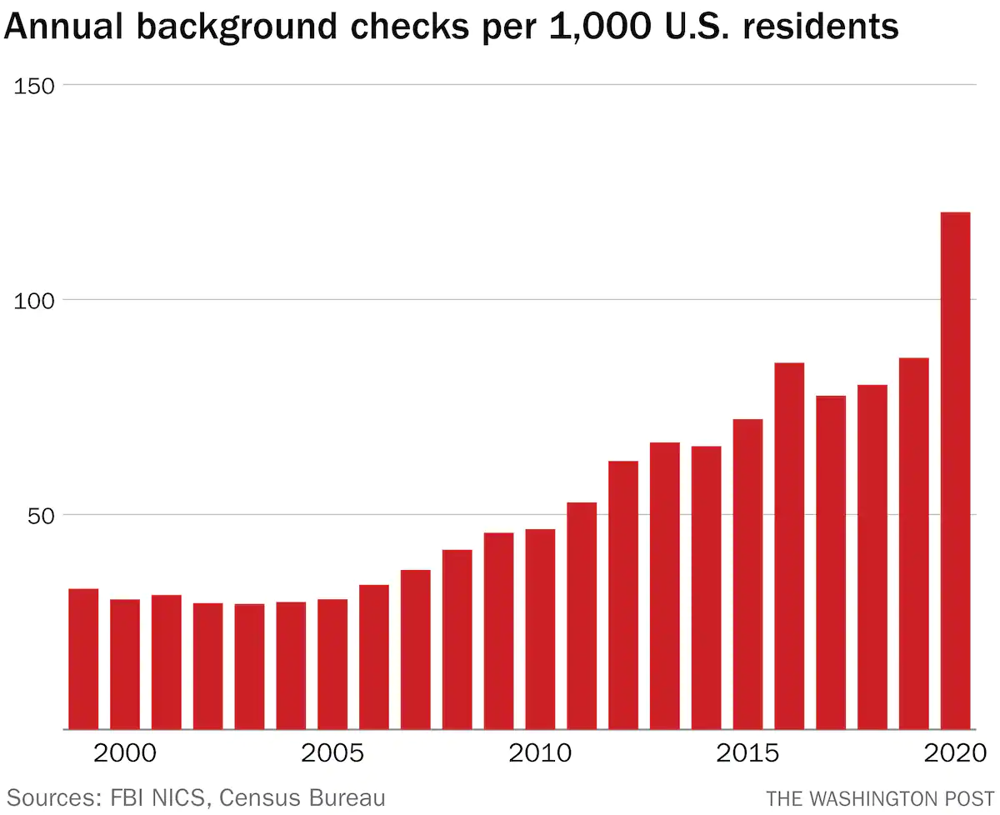

## Viz2


第二个Viz：Number of registered weapons in the United States in 2021, by state       

https://www.statista.com/statistics/215655/number-of-registered-weapons-in-the-us-by-state/